In [2]:
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import cv2

import os
import random

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

# PCa for feature visualization
# tARGETing labels 


2025-04-24 08:37:13.629088: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745476633.646054  314766 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745476633.650770  314766 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-24 08:37:13.666106: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
pretrained_model = tf.keras.applications.MobileNetV2(include_top=True,
                                                     weights='imagenet')
pretrained_model.trainable = False

# ImageNet labels
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

2025-04-24 08:37:19.305194: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


In [4]:
# Helper function to preprocess the image so that it can be inputted in MobileNetV2
def preprocess(image):
  image = tf.cast(image, tf.float32)
  image = tf.image.resize(image, (224, 224))
  image = tf.keras.applications.mobilenet_v2.preprocess_input(image)
  image = image[None, ...]
  return image

# Helper function to extract labels from probability vector
def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]

In [49]:
full_path = "/home/paul/Dokumente/Uni.lu/SS_25/BSP 6/src/adversarial_images/"
image_files = [f for f in os.listdir(full_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random_image = random.choice(image_files)

In [50]:
image_path = tf.keras.utils.get_file(random_image, 'file://' + full_path + random_image)
image_raw = tf.io.read_file(image_path)
image = tf.image.decode_image(image_raw)

image_pr = preprocess(image)
image_probs = pretrained_model.predict(image_pr)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


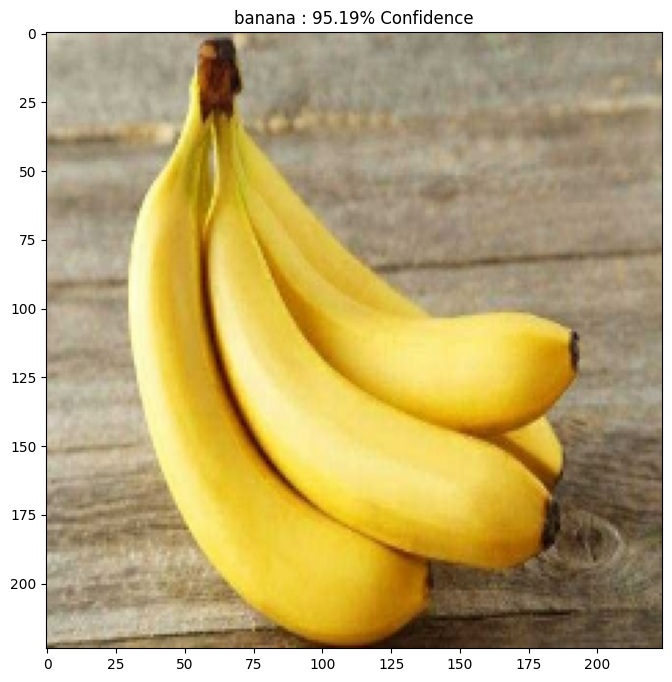

In [51]:
plt.figure()
plt.imshow(image_pr[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
_, image_class, class_confidence = get_imagenet_label(image_probs)
plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
plt.show()

In [155]:
loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label):
  with tf.GradientTape() as tape:
    tape.watch(input_image)
    prediction = pretrained_model(input_image)
    loss = loss_object(input_label, prediction)

  # Get the gradients of the loss w.r.t to the input image.
  gradient = tape.gradient(loss, input_image)
  # Get the sign of the gradients to create the perturbation
  signed_grad = tf.sign(gradient)
  return signed_grad

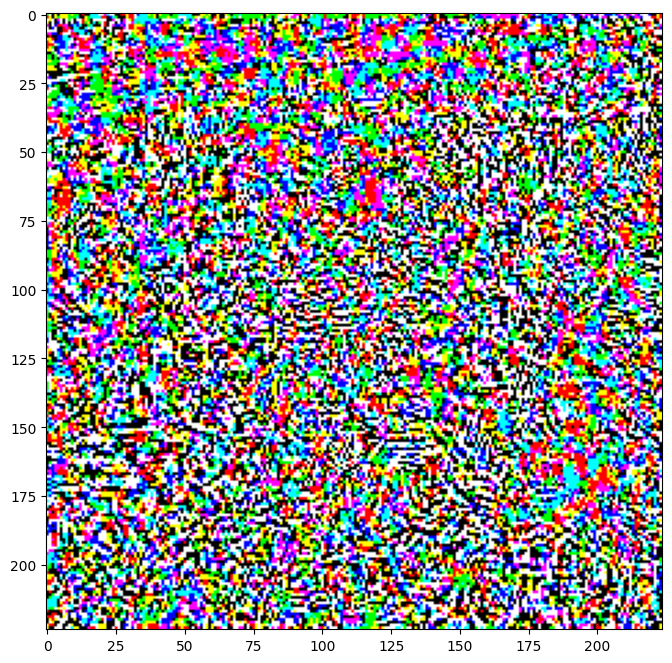

In [156]:
# Get the input label of the image.
banana_index = 954
label = tf.one_hot(banana_index, image_probs.shape[-1])
label = tf.reshape(label, (1, image_probs.shape[-1]))

perturbations = create_adversarial_pattern(image_pr, label)
plt.imshow(perturbations[0] * 0.5 + 0.5);  # To change [-1, 1] to [0,1]

In [157]:
def display_images(image, description):
  _, label, confidence = get_imagenet_label(pretrained_model.predict(image))
  plt.figure()
  plt.imshow(image[0]*0.5+0.5)
  plt.title('{} \n {} : {:.2f}% Confidence'.format(description,
                                                   label, confidence*100))
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


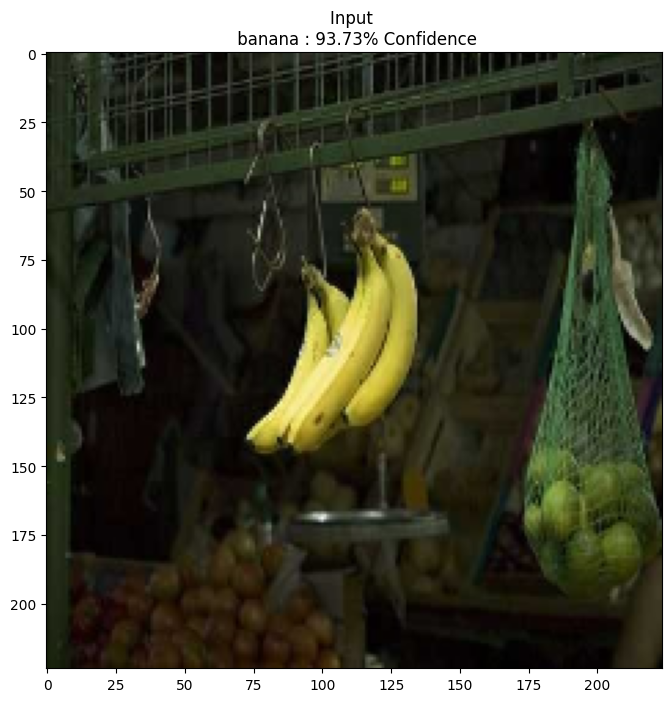

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


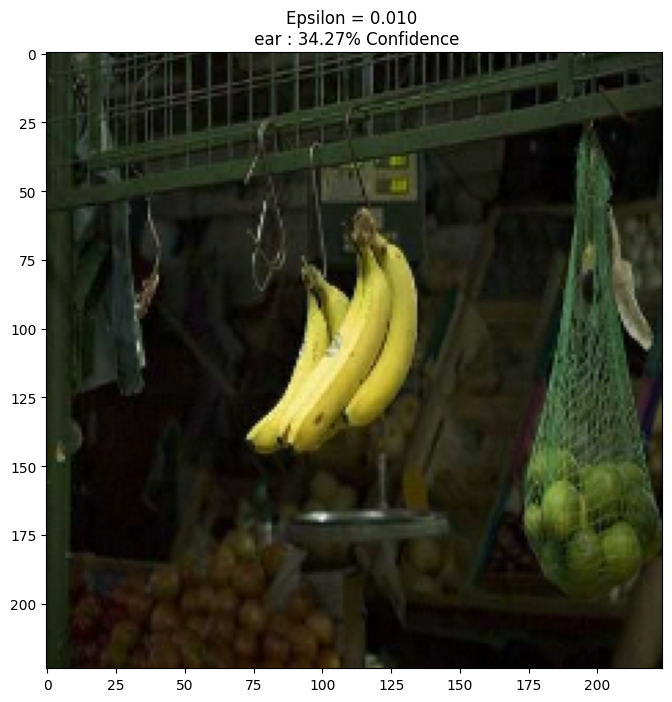

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


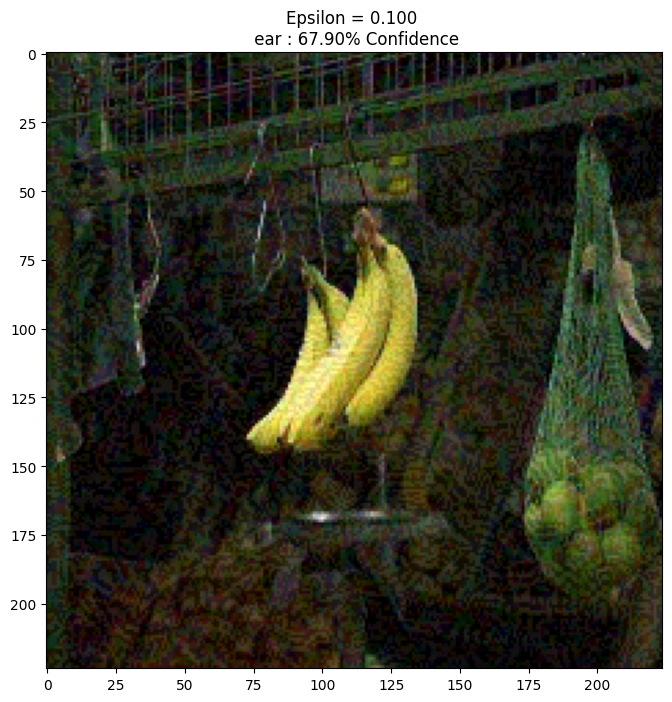

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


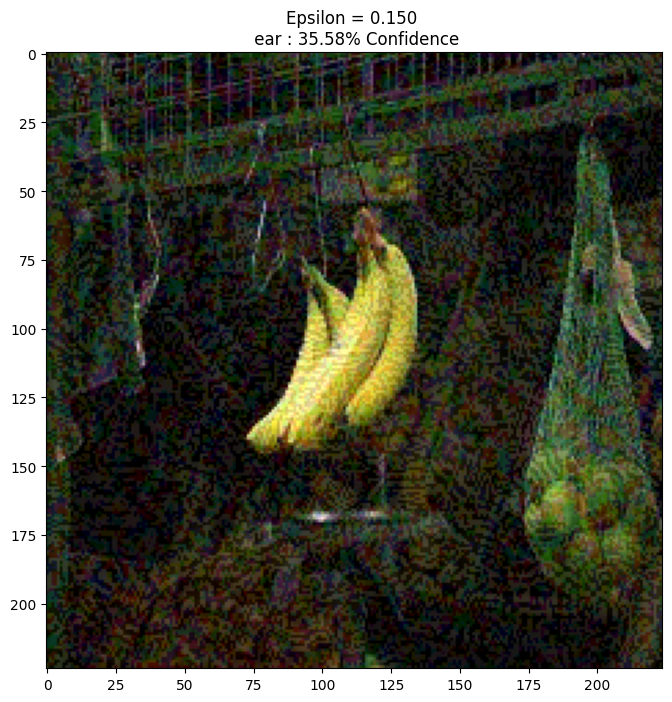

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


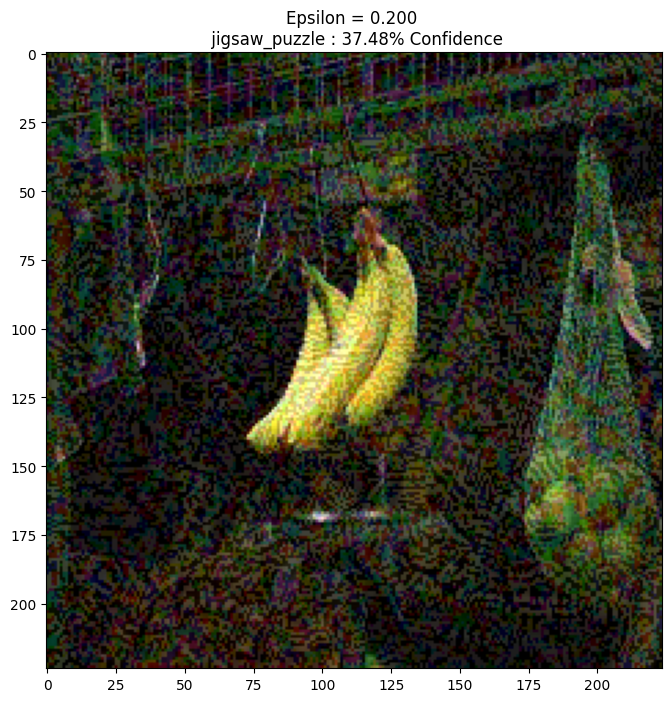

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


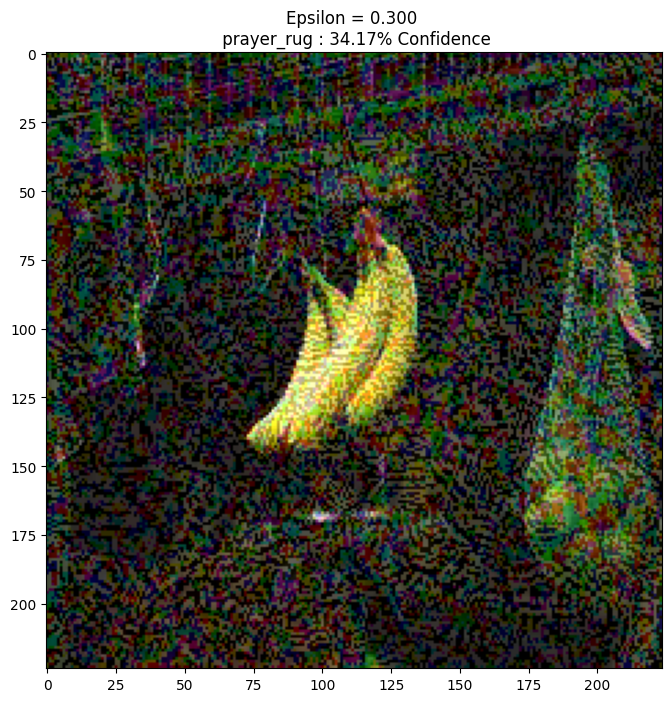

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


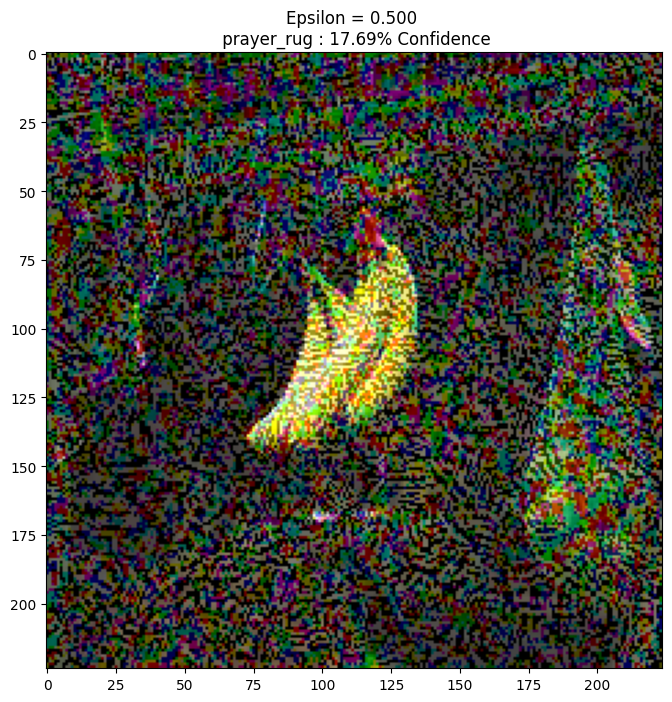

In [158]:
epsilons = [0, 0.01, 0.1, 0.15, 0.2, 0.3, 0.5]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]

for i, eps in enumerate(epsilons):
  adv_x = image_pr + eps*perturbations
  adv_x = tf.clip_by_value(adv_x, -1, 1)
  display_images(adv_x, descriptions[i])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


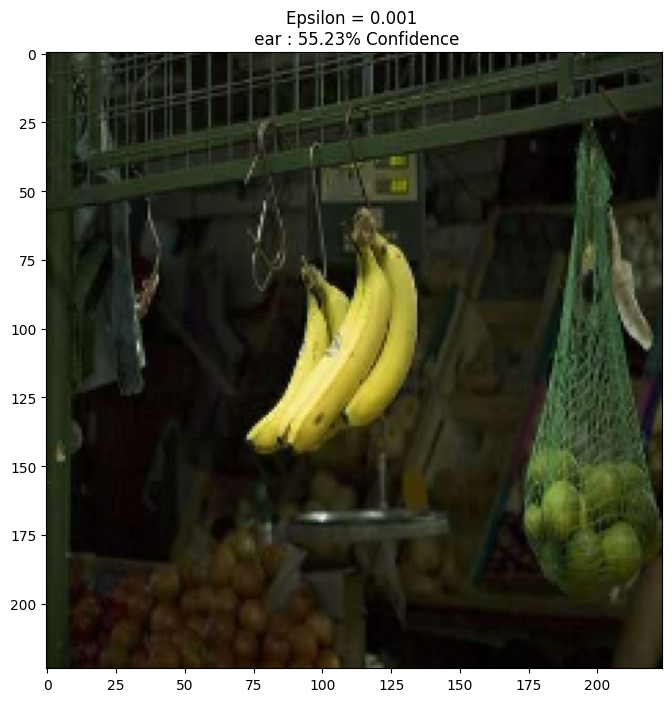

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


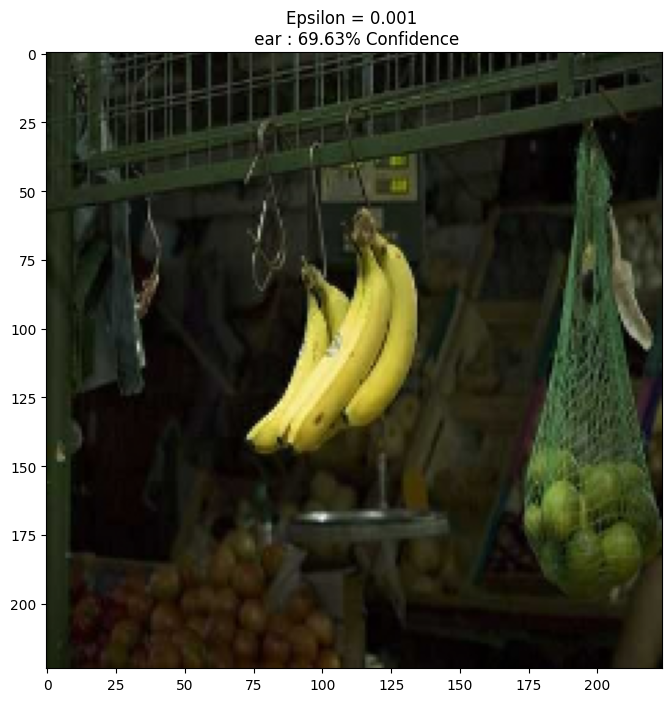

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


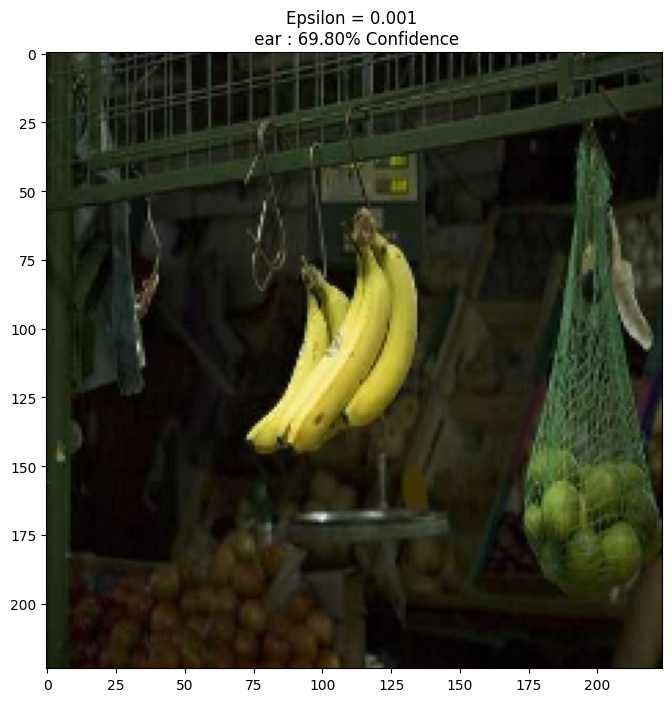

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


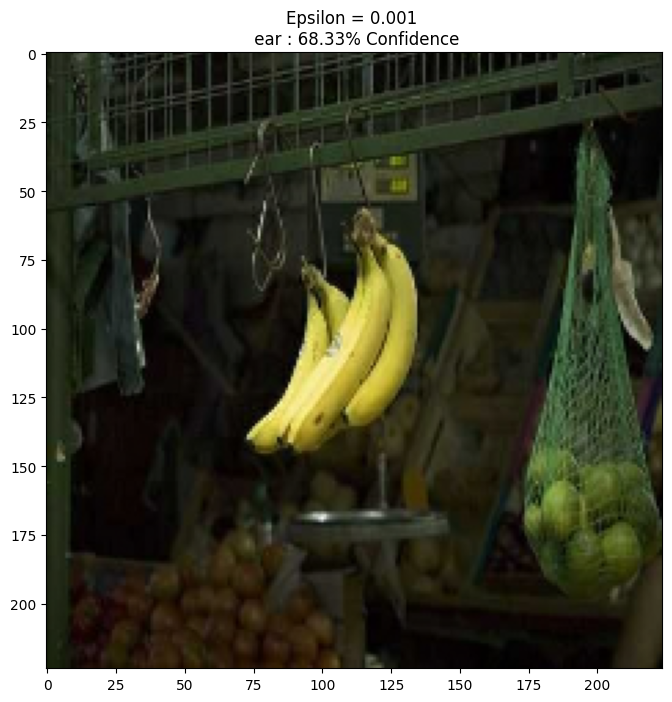

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


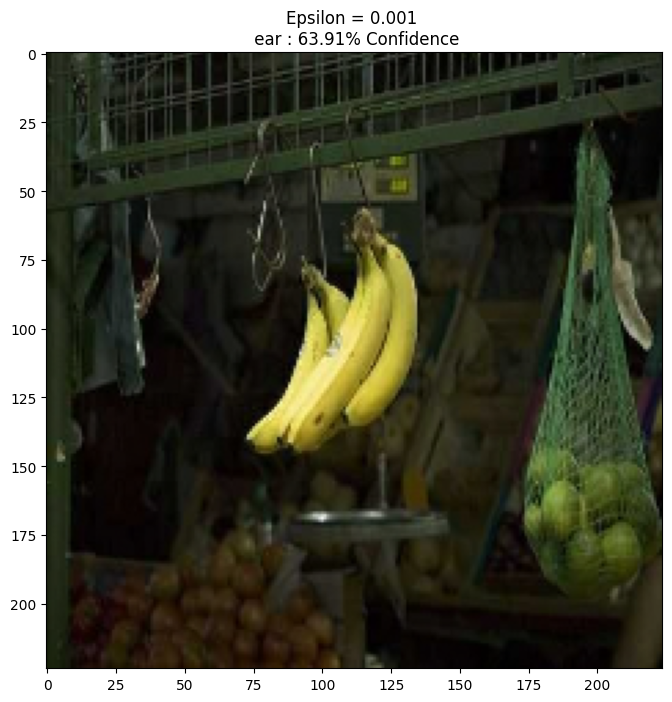

In [159]:
epsilons = [0.001]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]
pertubated = image_pr
for j in range(0, 10, 2):
    for i, eps in enumerate(epsilons):
        adv_x = pertubated + eps*perturbations
        adv_x = tf.clip_by_value(adv_x, -1, 1)
        display_images(adv_x, descriptions[i])
    pertubated = adv_x

In [160]:
# For clipping the input vector
def clip_delta(t, eps):
    return tf.clip_by_value(t, -eps, eps)


# Generates targeted adversarial images
def generate_adv_pertubation(model, optimizer, loss, img, delta, label, target_label, eps, max_iterations=500):
    # delta = tf.Variable(tf.zeros_like(img), trainable=True)
    
    for step in range(max_iterations):
        with tf.GradientTape() as tape:
            tape.watch(delta)
            adv = preprocess(img + delta)

            preds = model(adv,training=False)
            # print(preds)
            originalLoss = -loss(tf.convert_to_tensor([label]), preds)
            targetLoss = loss(tf.convert_to_tensor([target_label]), preds)
            totalLoss = originalLoss + targetLoss

            if step % 50 == 0:
                print("step: {}, loss: {}...".format(step, totalLoss.numpy()), "Range:", tf.reduce_min(adv).numpy(), "to", tf.reduce_max(adv).numpy())

            gradients = tape.gradient(totalLoss, delta)
            optimizer.apply_gradients([(gradients, delta)])
            delta.assign_add(clip_delta(delta, eps))
    
    return delta


def preprocess_image(image):
	# swap color channels, resize the image, and add in a batch dimension
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    image = np.expand_dims(image, axis=0)
    return image


In [161]:
# full_path = "/home/paul/Dokumente/Uni.lu/SS_25/BSP 6/src/banana_images2/data/train/banana/"
# image_files = [f for f in os.listdir(full_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
# random_image = random.choice(image_files)

# image_path = tf.keras.utils.get_file(random_image, 'file://' + full_path + random_image)
# image_raw = tf.io.read_file(image_path)
# image = tf.image.decode_image(image_raw)

# image_pr = preprocess(image)
# image_probs = pretrained_model.predict(image_pr)

<tf.Variable 'Variable:0' shape=() dtype=int32, numpy=953>
step: 0, loss: 6.165385723114014... Range: -1.0 to 0.99829245
step: 50, loss: -5.0666608810424805... Range: -1.0046546 to 0.995463
step: 100, loss: -13.305628776550293... Range: -1.0098286 to 1.0005393
step: 150, loss: -20.170623779296875... Range: -1.014065 to 1.0020413
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009985566..1.0026085].


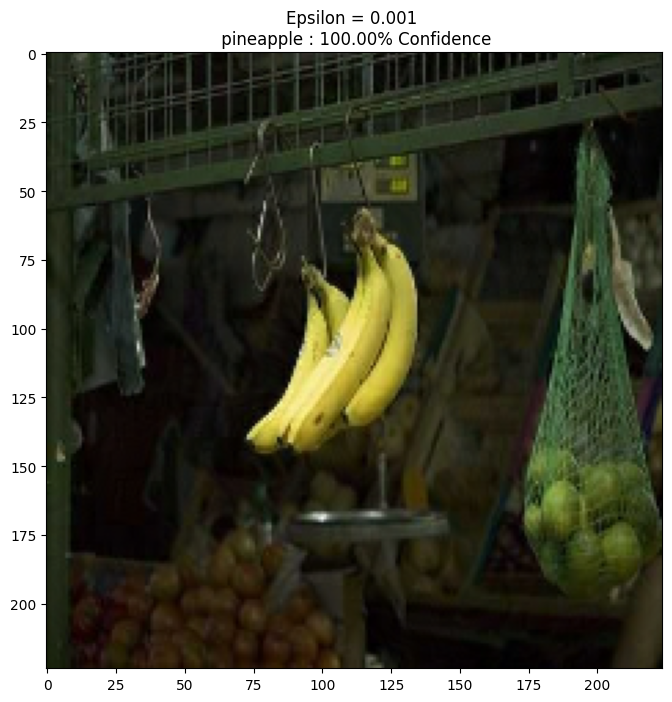

step: 0, loss: 6.165385723114014... Range: -1.0 to 0.99829245
step: 50, loss: -7.223540306091309... Range: -1.0081446 to 0.9971746
step: 100, loss: -14.838948249816895... Range: -1.0163069 to 1.0001962
step: 150, loss: -20.996747970581055... Range: -1.0243604 to 1.0041158
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016438067..1.0055972].


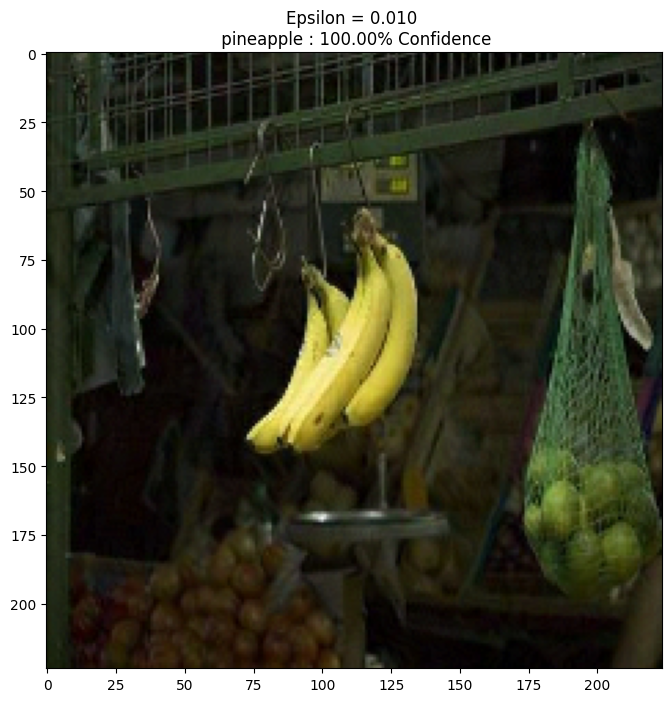

step: 0, loss: 6.165385723114014... Range: -1.0 to 0.99829245
step: 50, loss: -8.23354434967041... Range: -1.0231141 to 1.0113997
step: 100, loss: -13.34170913696289... Range: -1.0463074 to 1.0282207
step: 150, loss: -17.640039443969727... Range: -1.0702441 to 1.0508399
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046748757..1.036741].


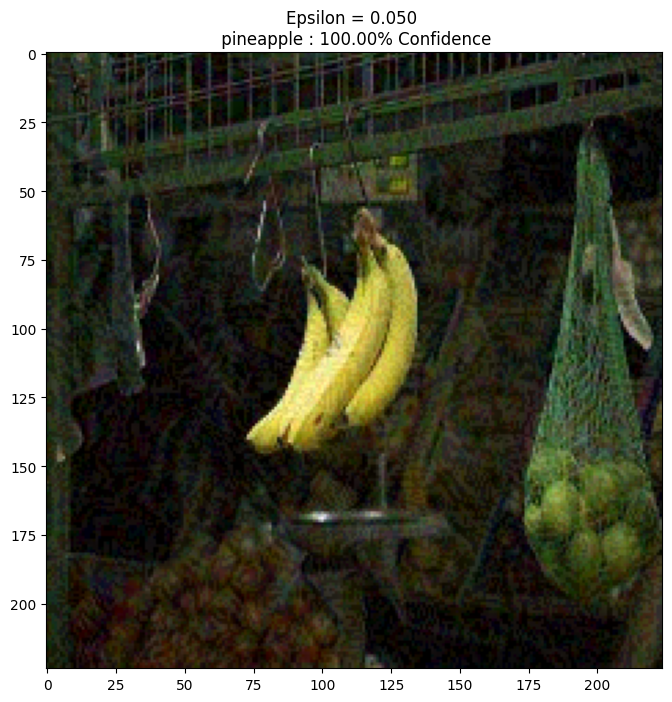

<tf.Variable 'Variable:0' shape=() dtype=int32, numpy=859>
step: 0, loss: 11.571930885314941... Range: -1.0 to 0.99829245
step: 50, loss: -1.0247483253479004... Range: -1.0044761 to 0.99763
step: 100, loss: -8.093811988830566... Range: -1.0097219 to 1.002439
step: 150, loss: -15.576217651367188... Range: -1.0129669 to 1.006495
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00958699..1.0048081].


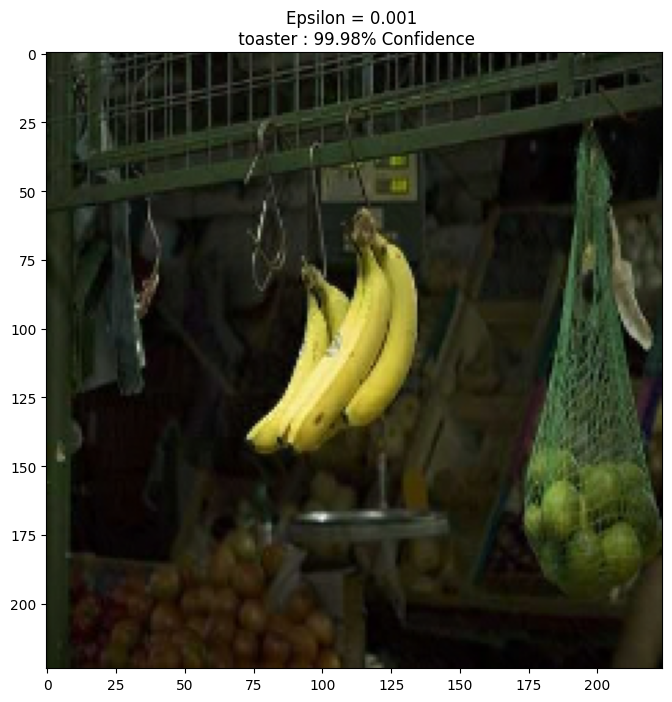

step: 0, loss: 11.571930885314941... Range: -1.0 to 0.99829245
step: 50, loss: -3.591862201690674... Range: -1.0082356 to 0.9968945
step: 100, loss: -10.502402305603027... Range: -1.0174658 to 1.0006084
step: 150, loss: -18.751846313476562... Range: -1.0247984 to 1.0058978
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017010093..1.0058243].


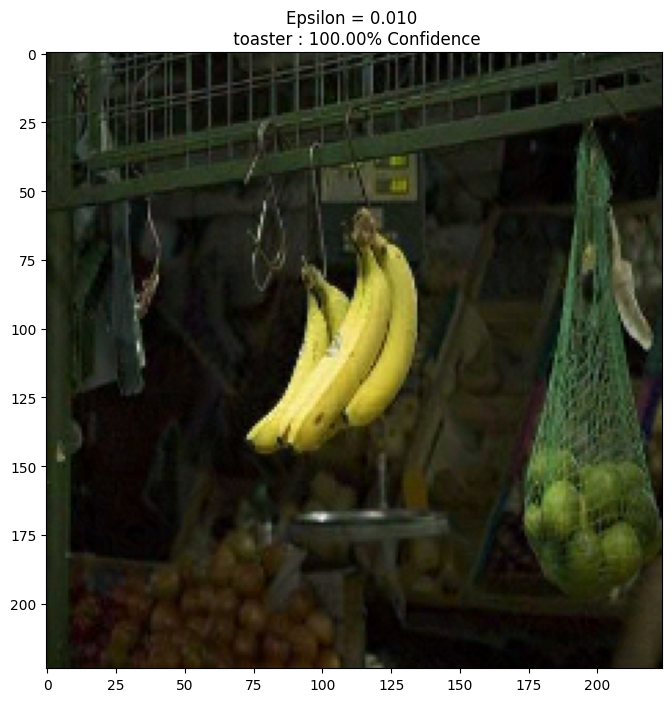

step: 0, loss: 11.571930885314941... Range: -1.0 to 0.99829245
step: 50, loss: -3.928853988647461... Range: -1.0229985 to 1.0114579
step: 100, loss: -8.215486526489258... Range: -1.0467114 to 1.0335829
step: 150, loss: -12.195083618164062... Range: -1.0709686 to 1.056309
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047345042..1.0407821].


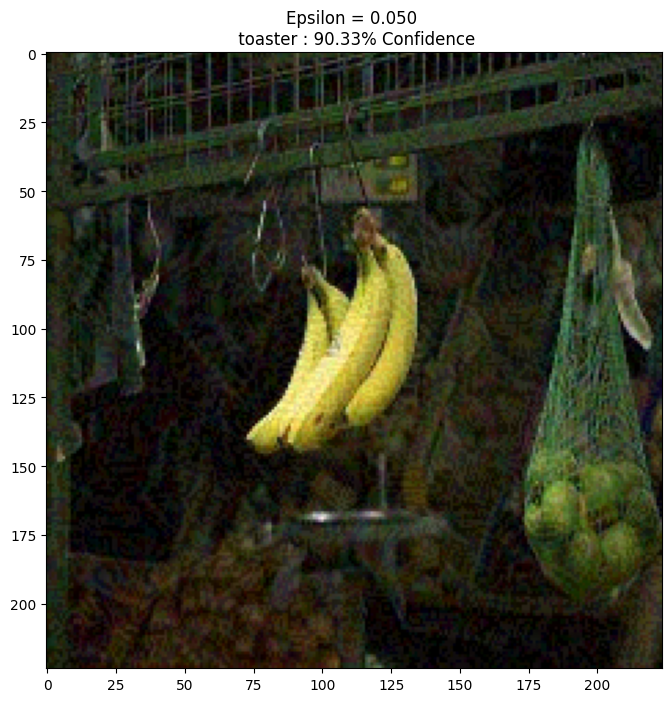

<tf.Variable 'Variable:0' shape=() dtype=int32, numpy=655>
step: 0, loss: 12.869986534118652... Range: -1.0 to 0.99829245
step: 50, loss: 0.6683540344238281... Range: -1.0044297 to 0.99923
step: 100, loss: -5.389918804168701... Range: -1.0090892 to 1.0036917
step: 150, loss: -10.626726150512695... Range: -1.0133955 to 1.0073409
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009060681..1.0050623].


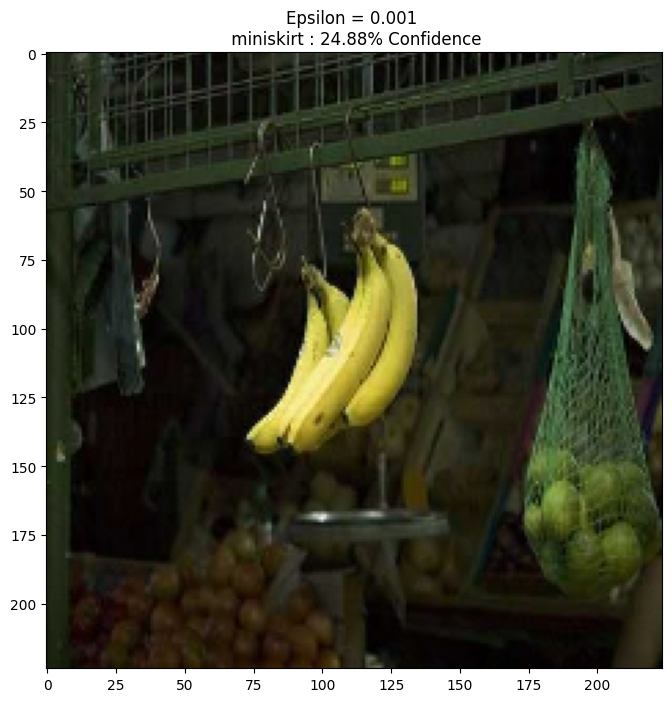

step: 0, loss: 12.869986534118652... Range: -1.0 to 0.99829245
step: 50, loss: -1.4611988067626953... Range: -1.0080501 to 1.002573
step: 100, loss: -6.402178764343262... Range: -1.0158762 to 1.0094783
step: 150, loss: -11.278837203979492... Range: -1.0237921 to 1.0146852
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015521169..1.0097042].


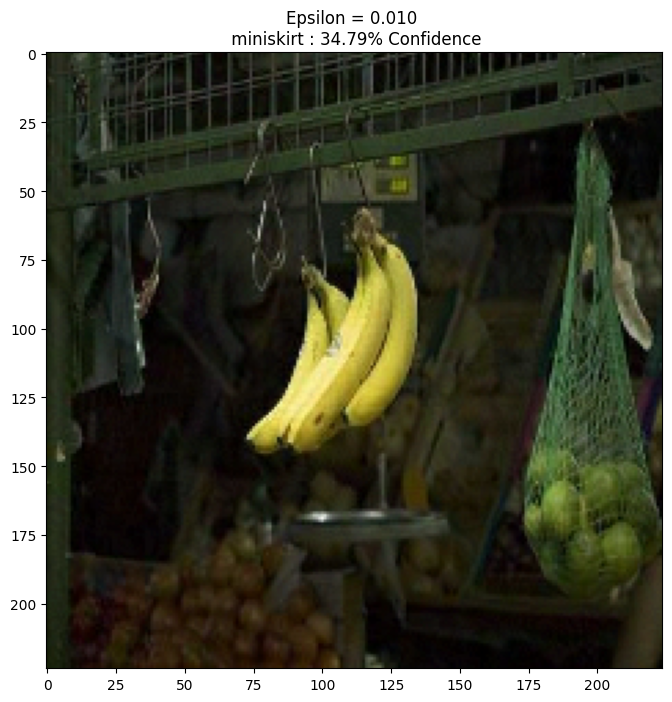

step: 0, loss: 12.869986534118652... Range: -1.0 to 0.99829245
step: 50, loss: -2.573367118835449... Range: -1.0231367 to 1.0163062
step: 100, loss: -5.199193954467773... Range: -1.0461886 to 1.0381489
step: 150, loss: -8.529374122619629... Range: -1.069965 to 1.0626624
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048137486..1.0416294].


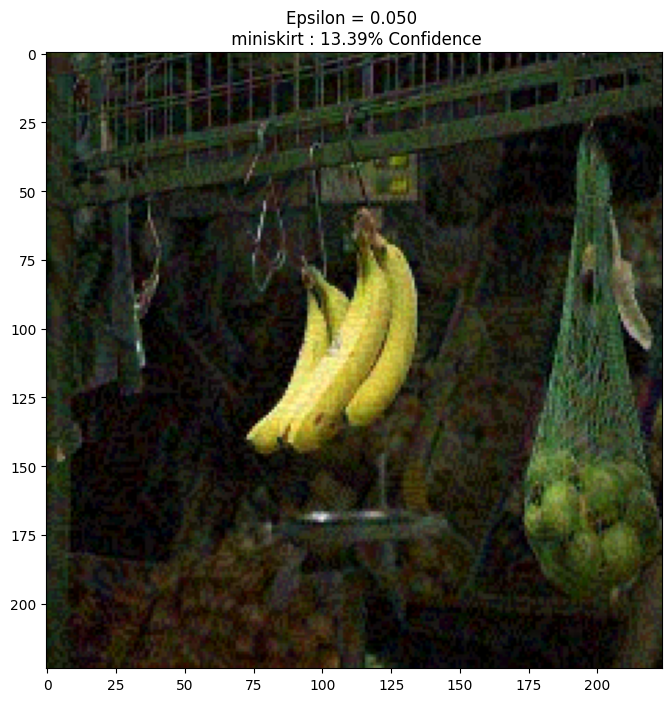

<tf.Variable 'Variable:0' shape=() dtype=int32, numpy=497>
step: 0, loss: 13.747568130493164... Range: -1.0 to 0.99829245
step: 50, loss: 1.7599339485168457... Range: -1.0044112 to 0.9979148
step: 100, loss: -3.422334671020508... Range: -1.0093762 to 1.0020676
step: 150, loss: -7.866405487060547... Range: -1.0134174 to 1.0044017
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009236038..1.0035655].


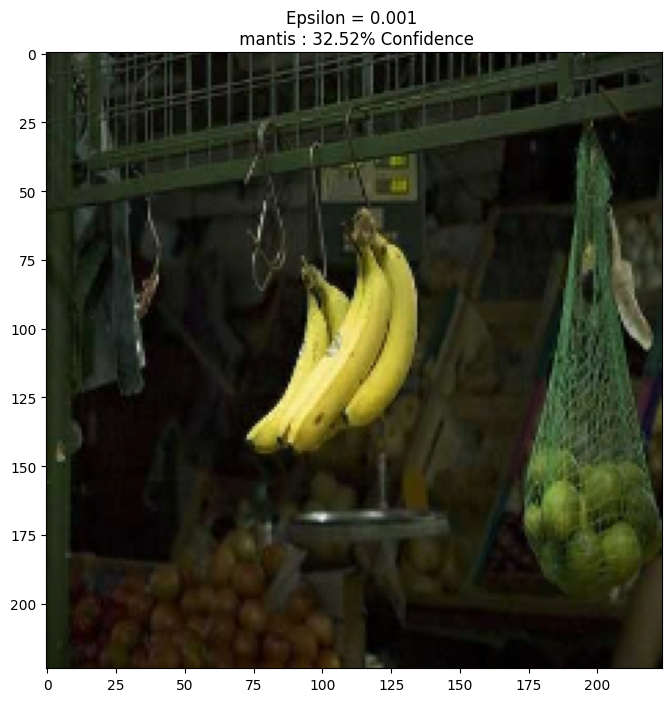

step: 0, loss: 13.747568130493164... Range: -1.0 to 0.99829245
step: 50, loss: -0.6012015342712402... Range: -1.0080863 to 1.0008197
step: 100, loss: -5.214334487915039... Range: -1.0160732 to 1.0070453
step: 150, loss: -8.98841667175293... Range: -1.0242364 to 1.0142143
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01688379..1.0110418].


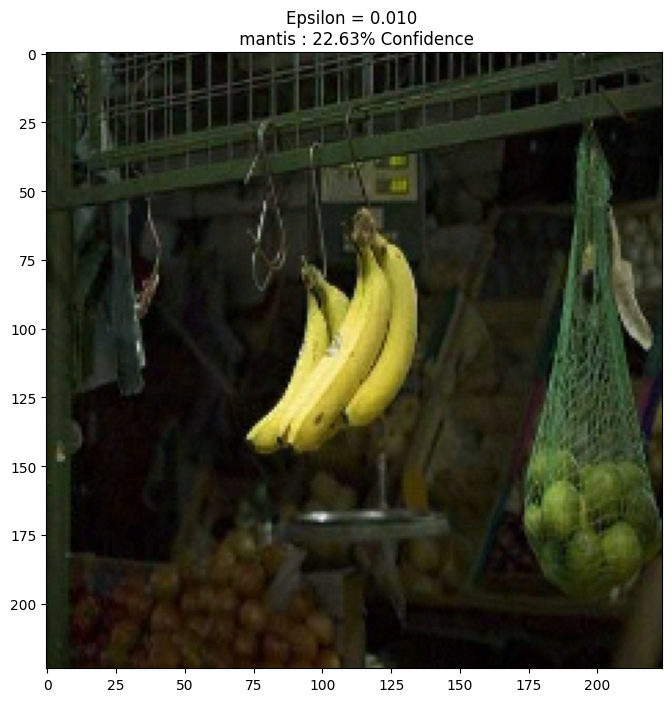

step: 0, loss: 13.747568130493164... Range: -1.0 to 0.99829245
step: 50, loss: -2.3373160362243652... Range: -1.0229124 to 1.0130398
step: 100, loss: -4.279869079589844... Range: -1.0459578 to 1.0321689
step: 150, loss: -6.782553672790527... Range: -1.0707566 to 1.0550663
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047388494..1.0391829].


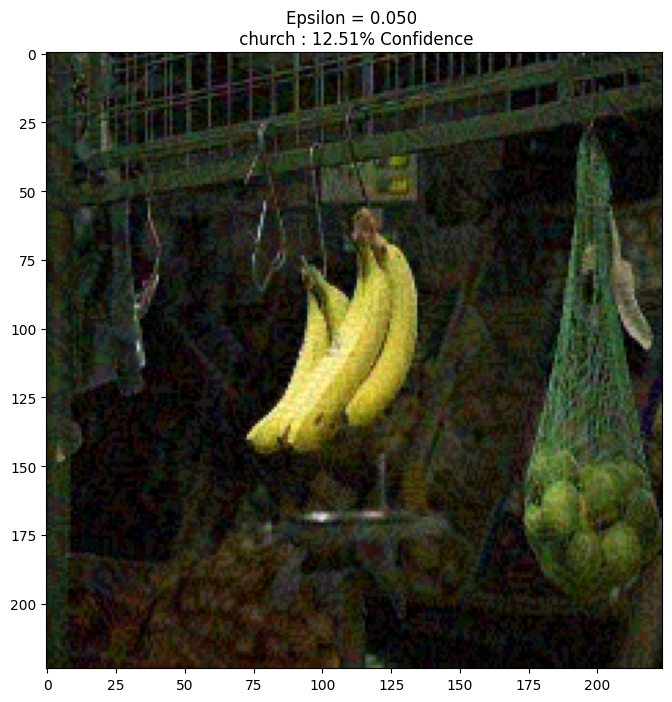

In [162]:
epsilons = [0.001, 0.01, 0.05]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]
i = 0
# descriptions[i]
targets = [tf.Variable(953), tf.Variable(859), tf.Variable(655), tf.Variable(497)]
# Pineapple, Toaster, Tank, Miniskirt, Church
class_label = tf.Variable(banana_index)
# target_label = tf.Variable(859) # Toaster
iterations = 200

for target_label in targets:
    print(target_label)
    for i, eps in enumerate(epsilons):
        loss = tf.keras.losses.SparseCategoricalCrossentropy()
        adam = tf.keras.optimizers.Adam(1e-2)
        # print("Range:", tf.reduce_min(image / 1).numpy(), "to", tf.reduce_max(image / 1).numpy())
        # print(descriptions[i])
        baseImage = tf.constant(image / 1, dtype=tf.float32)
        delta = tf.Variable(tf.zeros_like(baseImage), trainable=True)
        # print("Range:", tf.reduce_min(baseImage).numpy(), "to", tf.reduce_max(baseImage).numpy())

        target_pertubation = generate_adv_pertubation(pretrained_model, adam, loss, baseImage, delta, class_label, target_label, eps, iterations)

        # print("Range:", tf.reduce_min(target_pertubation).numpy(), "to", tf.reduce_max(target_pertubation).numpy())

        adv = (baseImage + target_pertubation)
        # print("Range:", tf.reduce_min(adv).numpy(), "to", tf.reduce_max(adv).numpy())
        # print(tf.reduce_min(target_pertubation), tf.reduce_max(target_pertubation))
        adv = preprocess(adv)
        # print("Range:", tf.reduce_min(adv).numpy(), "to", tf.reduce_max(adv).numpy())
        # min_value = tf.reduce_min(adv)
        # max_value = tf.reduce_max(adv)
        # scaled_adv = (adv - min_value) / (max_value - min_value)
        # scaled_adv = tf.clip_by_value(adv * 255, 0, 255)

        display_images(adv, descriptions[i])

In [1]:
path = "banana_images/data"
img_size = (224, 224)

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    path + "/train",
    label_mode="int",  # Integer labels (use "categorical" for one-hot encoding)
    image_size=img_size,
    batch_size=32
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    path + "/val",
    label_mode="int",
    image_size=img_size,
    batch_size=32
)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    path + "/test",
    label_mode="int",
    image_size=img_size,
    batch_size=32,
    shuffle=False
)

print("Classes: ", train_ds.class_names)
class_names = train_ds.class_names

NameError: name 'tf' is not defined